<a href="https://colab.research.google.com/github/nish700/tensorflow_workbooks/blob/main/Build_a_GAN(Generative_Adversarial_Network)_using_tensorflow.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

###Introduction

GAN stands for "Generative Adversarial Network." It is a class of artificial intelligence algorithms used in unsupervised machine learning. GAN's have become popular approach for generating realistic and high-quality synthetic data.

Here's a brief overview of how GANs work:

**Generator**: GANs consist of two neural networks – a generator and a discriminator. The generator takes random noise as input and generates synthetic data (e.g., images, text, or other types of content). The goal of the generator is to create data that is indistinguishable from real data.

**Discriminator**: The discriminator, on the other hand, takes both real data and the synthetic data generated by the generator as input. Its role is to distinguish between the real and synthetic data. Essentially, it acts as a binary classifier that assigns a probability of being real to each input.

**Adversarial Training**: The generator and discriminator are trained simultaneously through adversarial training. The generator aims to generate data that is so realistic that the discriminator cannot differentiate between real and synthetic samples. Meanwhile, the discriminator is trained to become better at distinguishing real from fake data.

**Training Dynamics**: As training progresses, the generator gets better at creating realistic data, and the discriminator improves at distinguishing between real and generated data. This adversarial process continues until the generator produces high-quality data that is difficult for the discriminator to differentiate.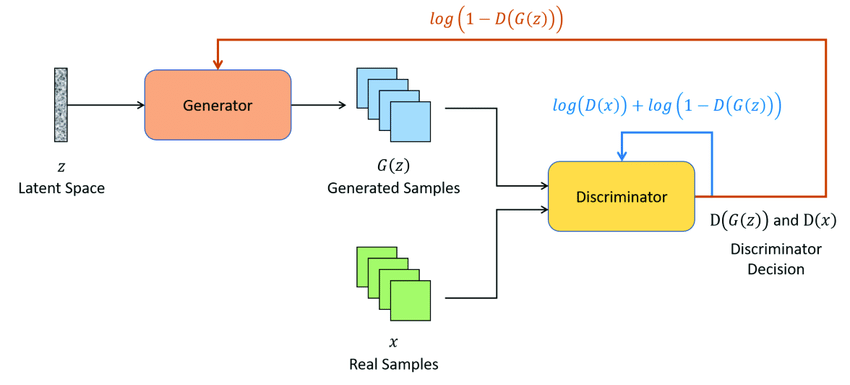

Image Credit : https://www.researchgate.net/figure/Typical-Generative-Adversarial-Networks-GAN-architecture_fig2_349182009


The training process can be conceptualized as a game where the generator and discriminator are in constant competition. Ideally, this adversarial training leads to the generator creating data that is indistinguishable from real data.

Detecting financial fraud is critical for safeguarding individuals, businesses, and the overall integrity of financial systems. Swift and accurate fraud detection not only prevents substantial financial losses but also upholds trust in financial institutions, ensures regulatory compliance, and protects economies from the damaging effects of fraudulent activities. Early intervention is essential for preserving market integrity, reducing operational costs, and maintaining the reputation of financial institutions in an increasingly complex and interconnected financial landscape.

In financial services, including credit card transactions and online banking, fraud rates are often reported to be a small percentage of total transactions, typically ranging from 0.1% to 2%

In order to train an ML/DL model on the financial data , similar amount of fraudulent transaction and legitimate transaction are needed. In this notebook , we are going to use GAN to generate fake fraudulent transactions data.

Data Credit : https://data.world/raghu543/credit-card-fraud-data

#### Importing the Libraries

In [ ]:
import numpy as np
import pandas as pd

# Importing neural network modules
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, BatchNormalization, LeakyReLU, Dropout
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.initializers import RandomNormal


# Importing some machine learning modules
from sklearn.utils import shuffle
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler


# Import data visualization modules
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

print("Modules are imported!")

Modules are imported!


#### Importing the data

In [ ]:
#loading data from drive
from google.colab import drive
drive.mount('/gdrive')

Drive already mounted at /gdrive; to attempt to forcibly remount, call drive.mount("/gdrive", force_remount=True).


In [ ]:
data_path = '/gdrive/MyDrive/Dataset/creditcard.csv'

In [ ]:
credit_data = pd.read_csv(data_path)

In [ ]:
credit_data.shape

(284807, 31)

In [ ]:
credit_data.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


#### Let's see how many genuine and limited fraudulent records we have

In [ ]:
credit_data['Class'].value_counts(normalize=True)

0    0.998273
1    0.001727
Name: Class, dtype: float64

As we see above more than 99.8% of data is legitimate transaction and less than 0.2% is fraudulent transaction.

### Data Preprocessing

*   Removing all the rows with `Nan` values
*   Removing `Time` column
*   Feature Scaling `Amount` column
*   Split the data into features and labels


#### Cleaning the dataset

In [ ]:
# first we will check presence of null values in the dataset
credit_data.isna().sum()

Time      0
V1        0
V2        0
V3        0
V4        0
V5        0
V6        0
V7        0
V8        0
V9        0
V10       0
V11       0
V12       0
V13       0
V14       0
V15       0
V16       0
V17       0
V18       0
V19       0
V20       0
V21       0
V22       0
V23       0
V24       0
V25       0
V26       0
V27       0
V28       0
Amount    0
Class     0
dtype: int64

In [ ]:
# if null values present , we need to run the below command to remove those records
credit_data.dropna()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284802,172786.0,-11.881118,10.071785,-9.834783,-2.066656,-5.364473,-2.606837,-4.918215,7.305334,1.914428,...,0.213454,0.111864,1.014480,-0.509348,1.436807,0.250034,0.943651,0.823731,0.77,0
284803,172787.0,-0.732789,-0.055080,2.035030,-0.738589,0.868229,1.058415,0.024330,0.294869,0.584800,...,0.214205,0.924384,0.012463,-1.016226,-0.606624,-0.395255,0.068472,-0.053527,24.79,0
284804,172788.0,1.919565,-0.301254,-3.249640,-0.557828,2.630515,3.031260,-0.296827,0.708417,0.432454,...,0.232045,0.578229,-0.037501,0.640134,0.265745,-0.087371,0.004455,-0.026561,67.88,0
284805,172788.0,-0.240440,0.530483,0.702510,0.689799,-0.377961,0.623708,-0.686180,0.679145,0.392087,...,0.265245,0.800049,-0.163298,0.123205,-0.569159,0.546668,0.108821,0.104533,10.00,0


#### Removing Time column

In [ ]:
credit_data.drop(columns='Time', axis=1, inplace=True)

#### Feature Scaling of Amount column

Feature scaling is performed to ensure that the numerical values of different features in a dataset are on a similar scale. This is crucial for many machine learning algorithms, as it helps to improve their performance and convergence.

In [ ]:
scaler = StandardScaler()

credit_data['Amount'] = scaler.fit_transform(credit_data[['Amount']])

credit_data.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,0.244964,0
1,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,-0.342475,0
2,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,1.160686,0
3,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,0.140534,0
4,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,-0.073403,0


#### Let's split the genuine and fraud records into separate dataframes

In [ ]:
genuine_trans = credit_data[credit_data['Class']==0]
fraud_trans = credit_data[credit_data['Class']==1]

genuine_trans.shape, fraud_trans.shape

((284315, 30), (492, 30))

#### Split the data into features and labels

In [ ]:
X = credit_data.drop('Class', axis=1)
y = credit_data['Class']

In [ ]:
X.shape, y.shape

((284807, 29), (284807,))

### Data Exploration
  - Apply PCA to reduce the dimensionality of features `X` into two dimensions
  - Use a scatter plot to visualize our data

In [ ]:
pca = PCA(n_components=2, random_state=21)

X_transformed = pca.fit_transform(X)

X_transformed

array([[ 1.32230516, -0.38932111],
       [-1.26967499, -0.07908854],
       [ 1.83447096,  1.34153112],
       ...,
       [-1.75639252,  0.93465787],
       [ 0.05691451, -0.68852935],
       [ 0.68641687,  0.2751689 ]])

In [ ]:
df_transformed = pd.DataFrame(X_transformed)

df_transformed['Labels'] = credit_data['Class']

df_transformed.head()

,0,1,Labels
0,1.322305,-0.389321,0
1,-1.269675,-0.079089,0
2,1.834471,1.341531,0
3,0.947011,-0.207689,0
4,0.937006,-1.140673,0


#### Visualize the dataset

We are going to use plotly to visualize the dataset

In [ ]:
px.scatter(df_transformed, x = 0, y = 1, color = df_transformed['Labels'].astype(str))

Here
      
     0 - Legitimate transaction

     1 - Fraudulent transactions

### Building the Generator Model

Write a method to create the Generator model architecture

In [ ]:
def build_generator():

    model = Sequential()

    model.add(Dense(units = 32, activation = 'relu', input_dim = 29, kernel_initializer = 'he_uniform'))
    model.add(BatchNormalization())

    model.add(Dense(units = 64, activation = 'relu'))
    model.add(BatchNormalization())

    model.add(Dense(units=128, activation='relu'))
    model.add(BatchNormalization())

    model.add(Dense(units=64, activation='relu'))
    model.add(BatchNormalization())

    model.add(Dense(units = 29, activation = 'linear'))
    # model.add(Dense(units = 29, activation = 'relu'))

    model.summary()

    return model

Out of the Linear and Relu activation, Linear activation performs better

In [ ]:
build_generator()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 32)                960       
                                                                 
 batch_normalization (Batch  (None, 32)                128       
 Normalization)                                                  
                                                                 
 dense_1 (Dense)             (None, 64)                2112      
                                                                 
 batch_normalization_1 (Bat  (None, 64)                256       
 chNormalization)                                                
                                                                 
 dense_2 (Dense)             (None, 128)               8320      
                                                                 
 batch_normalization_2 (Bat  (None, 128)               5

### Building the Discriminator Model

In [ ]:
def build_discriminator():

  model = Sequential()

  model.add(Dense(units=128, activation='relu', input_dim = 29, kernel_initializer='he_uniform'))

  model.add(Dense(units=64, activation='relu'))

  model.add(Dense(units=32, activation='relu'))

  model.add(Dense(units=64, activation='relu'))

  model.add(Dropout(rate=0.2))

  model.add(Dense(units = 32, activation='relu'))

  model.add(Dropout(rate=0.2))

  model.add(Dense(units= 1, activation='sigmoid'))

  model.compile(optimizer='adam', loss = 'binary_crossentropy')

  model.summary()

  return model


build_discriminator()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5 (Dense)             (None, 128)               3840      
                                                                 
 dense_6 (Dense)             (None, 64)                8256      
                                                                 
 dense_7 (Dense)             (None, 32)                2080      
                                                                 
 dense_8 (Dense)             (None, 64)                2112      
                                                                 
 dropout (Dropout)           (None, 64)                0         
                                                                 
 dense_9 (Dense)             (None, 32)                2080      
                                                                 
 dropout_1 (Dropout)         (None, 32)               

### Combine Generator and Discriminator models to Build The GAN

In [ ]:
def build_gan(generator, discriminator):

  gan_input = Input(shape = (generator.input_shape[1],))
  x = generator(gan_input)

  gan_output = discriminator(x)

  gan = Model(gan_input, gan_output)

  gan.summary()

  return gan

#### Method that generates synthetic data using the Generator

In [ ]:
def generate_synthetic_data(generator, num_samples):
  noise = np.random.normal(0, 1, size = (num_samples, generator.input_shape[1]))
  fake_data = generator.predict(noise)
  return fake_data

### Train and evaluate our GAN
*    Training the GAN
*    Monitor the GAN performance using PCA




In [34]:
def monitor_generator(generator):

    pca = PCA(n_components=2)

    real_fraud_data = fraud_trans.drop("Class", axis=1)

    transformed_data_real = pca.fit_transform(real_fraud_data.values)

    df_real = pd.DataFrame(transformed_data_real)
    df_real['label'] = "real"

    synthetic_fraud_data = generate_synthetic_data(generator, 492)

    transformed_data_fake = pca.fit_transform(synthetic_fraud_data)

    # Create a DataFrame for the transformed fake data and add a 'label' column with the value 'fake'
    df_fake = pd.DataFrame(transformed_data_fake)
    df_fake['label'] = "fake"

    # Concatenate the real and fake data DataFrames
    df_combined = pd.concat([df_real, df_fake])

    # Create a scatterplot to visualize the data points, using the first and second PCA components

    plt.figure(figsize = (6,4))
    sns.scatterplot(data=df_combined, x=0, y=1, hue='label', s=10)
    plt.show()

#### Training the GAN

Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_77 (Dense)            (None, 32)                960       
                                                                 
 batch_normalization_28 (Ba  (None, 32)                128       
 tchNormalization)                                               
                                                                 
 dense_78 (Dense)            (None, 64)                2112      
                                                                 
 batch_normalization_29 (Ba  (None, 64)                256       
 tchNormalization)                                               
                                                                 
 dense_79 (Dense)            (None, 128)               8320      
                                                                 
 batch_normalization_30 (Ba  (None, 128)             

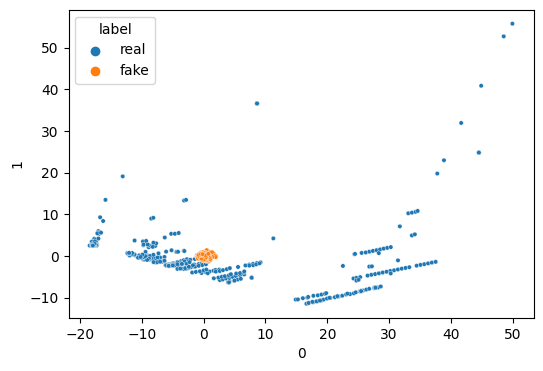

Epoch : 1
1/1 [==============================] - 0s 18ms/step
Epoch : 2
1/1 [==============================] - 0s 15ms/step
Epoch : 3
1/1 [==============================] - 0s 18ms/step
Epoch : 4
1/1 [==============================] - 0s 19ms/step
Epoch : 5
1/1 [==============================] - 0s 20ms/step
Epoch : 6
1/1 [==============================] - 0s 19ms/step
Epoch : 7
1/1 [==============================] - 0s 18ms/step
Epoch : 8
1/1 [==============================] - 0s 18ms/step
Epoch : 9
1/1 [==============================] - 0s 23ms/step
Epoch : 10
1/1 [==============================] - 0s 24ms/step
Epoch : 11
1/1 [==============================] - 0s 19ms/step
Epoch : 12
1/1 [==============================] - 0s 15ms/step
Epoch : 13
1/1 [==============================] - 0s 18ms/step
Epoch : 14
1/1 [==============================] - 0s 19ms/step
Epoch : 15
1/1 [==============================] - 0s 19ms/step
Epoch : 16
1/1 [==============================] - 0s 16ms/step
E

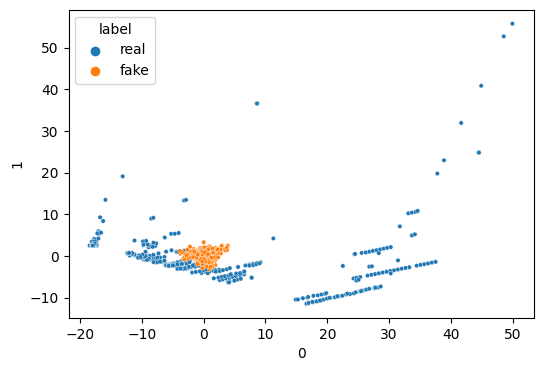

Epoch : 51
1/1 [==============================] - 0s 16ms/step
Epoch : 52
1/1 [==============================] - 0s 16ms/step
Epoch : 53
1/1 [==============================] - 0s 16ms/step
Epoch : 54
1/1 [==============================] - 0s 20ms/step
Epoch : 55
1/1 [==============================] - 0s 19ms/step
Epoch : 56
1/1 [==============================] - 0s 23ms/step
Epoch : 57
1/1 [==============================] - 0s 19ms/step
Epoch : 58
1/1 [==============================] - 0s 19ms/step
Epoch : 59
1/1 [==============================] - 0s 16ms/step
Epoch : 60
1/1 [==============================] - 0s 20ms/step
Epoch : 61
1/1 [==============================] - 0s 17ms/step
Epoch : 62
1/1 [==============================] - 0s 17ms/step
Epoch : 63
1/1 [==============================] - 0s 16ms/step
Epoch : 64
1/1 [==============================] - 0s 18ms/step
Epoch : 65
1/1 [==============================] - 0s 16ms/step
Epoch : 66
1/1 [==============================] - 0s 17

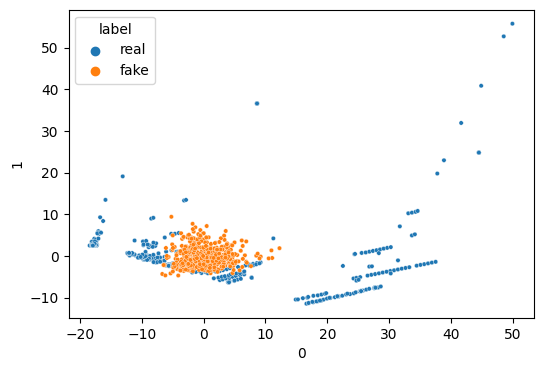

Epoch : 101
1/1 [==============================] - 0s 24ms/step
Epoch : 102
1/1 [==============================] - 0s 24ms/step
Epoch : 103
1/1 [==============================] - 0s 33ms/step
Epoch : 104
1/1 [==============================] - 0s 26ms/step
Epoch : 105
1/1 [==============================] - 0s 38ms/step
Epoch : 106
1/1 [==============================] - 0s 27ms/step
Epoch : 107
1/1 [==============================] - 0s 30ms/step
Epoch : 108
1/1 [==============================] - 0s 26ms/step
Epoch : 109
1/1 [==============================] - 0s 25ms/step
Epoch : 110
1/1 [==============================] - 0s 31ms/step
Epoch : 111
1/1 [==============================] - 0s 36ms/step
Epoch : 112
1/1 [==============================] - 0s 35ms/step
Epoch : 113
1/1 [==============================] - 0s 32ms/step
Epoch : 114
1/1 [==============================] - 0s 32ms/step
Epoch : 115
1/1 [==============================] - 0s 34ms/step
Epoch : 116
1/1 [=======================

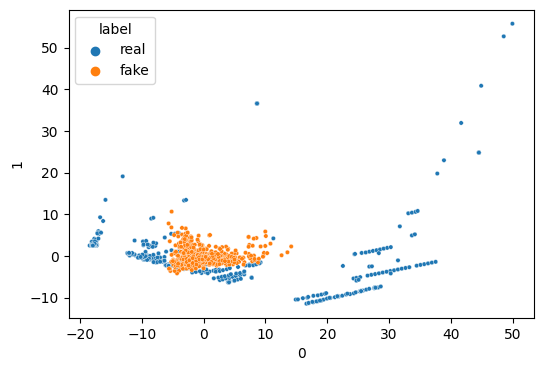

Epoch : 151
1/1 [==============================] - 0s 18ms/step
Epoch : 152
1/1 [==============================] - 0s 16ms/step
Epoch : 153
1/1 [==============================] - 0s 20ms/step
Epoch : 154
1/1 [==============================] - 0s 16ms/step
Epoch : 155
1/1 [==============================] - 0s 18ms/step
Epoch : 156
1/1 [==============================] - 0s 16ms/step
Epoch : 157
1/1 [==============================] - 0s 23ms/step
Epoch : 158
1/1 [==============================] - 0s 20ms/step
Epoch : 159
1/1 [==============================] - 0s 15ms/step
Epoch : 160
1/1 [==============================] - 0s 16ms/step
Epoch : 161
1/1 [==============================] - 0s 15ms/step
Epoch : 162
1/1 [==============================] - 0s 16ms/step
Epoch : 163
1/1 [==============================] - 0s 15ms/step
Epoch : 164
1/1 [==============================] - 0s 17ms/step
Epoch : 165
1/1 [==============================] - 0s 16ms/step
Epoch : 166
1/1 [=======================

In [37]:
#training loop
generator = build_generator()
discriminator = build_discriminator()
gan = build_gan(generator, discriminator)
gan.compile(optimizer='adam', loss='binary_crossentropy')

num_epochs = 200
batch_size = 64
half_batch = int(batch_size/2)

for epoch in range(num_epochs):

  print(f"Epoch : {epoch}")

  X_fake = generate_synthetic_data(generator, half_batch)
  y_fake = np.zeros((half_batch, 1))

  X_real = fraud_trans.drop('Class', axis= 1).sample(half_batch)
  y_real = np.ones((half_batch, 1))

  discriminator.trainable =True
  discriminator.train_on_batch(X_real, y_real)
  discriminator.train_on_batch(X_fake, y_fake)

  #train
  noise = np.random.normal(0 , 1, size = (batch_size, 29))
  gan.train_on_batch(noise, np.ones((batch_size, 1)))


  if epoch % 50 == 0:
    monitor_generator(generator)

### Generate synthetic data using the trained Generator

*   Generate 1000 fradulent data points using the trained generator
*   Compare the distribution of `real` and `synthetic` fradulent data points.


In [ ]:
synthetic_data = generate_synthetic_data(generator, 1000)
df = pd.DataFrame(synthetic_data)
df['label'] = 'fake'

df2 = fraud_trans.drop('Class', axis= 1)
df2['label'] = 'real'
df2.columns = df.columns

combined_df = pd.concat([df, df2])
combined_df

32/32 [==============================] - 0s 3ms/step


,0,1,2,3,4,5,6,7,8,9,...,20,21,22,23,24,25,26,27,28,label
0,-1.266311,2.734644,-1.476976,1.801506,-0.789866,-1.412520,-3.375749,-0.518126,-1.357712,-4.520032,...,-0.250385,0.112996,0.098518,-0.198428,0.071950,0.373576,-1.219665,-0.187812,-0.107636,fake
1,0.072173,2.369088,-1.323848,-0.363218,-1.166844,-0.343679,-1.741725,-0.551800,0.359964,-5.770732,...,0.906387,0.056926,-0.542277,-0.900160,0.616494,-0.422410,-0.702295,-0.117851,-1.146442,fake
2,-3.246890,1.009533,-3.438982,0.509384,-3.320156,-0.027072,-1.395573,0.353125,-1.443220,-5.033715,...,-0.373907,0.593951,0.583402,-0.427990,-0.176360,0.025352,-0.133418,0.059266,0.926086,fake
3,-2.657718,0.564916,-4.787193,2.046919,-2.493481,-4.813089,-1.662328,3.339295,-1.091931,-9.205049,...,0.426452,-0.034474,1.808963,-0.229657,1.424582,-1.297902,0.447462,-0.918598,-2.711440,fake
4,-0.657079,-2.980024,-1.721268,7.315529,10.237309,-0.708281,1.474838,0.474339,-1.842417,4.349513,...,3.244459,1.699339,-1.219712,-0.137752,-0.662479,0.328585,0.920917,-1.123473,0.075250,fake
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
279863,-1.927883,1.125653,-4.518331,1.749293,-1.566487,-2.010494,-0.882850,0.697211,-2.064945,-5.587794,...,0.778584,-0.319189,0.639419,-0.294885,0.537503,0.788395,0.292680,0.147968,1.206024,real
280143,1.378559,1.289381,-5.004247,1.411850,0.442581,-1.326536,-1.413170,0.248525,-1.127396,-3.232153,...,0.370612,0.028234,-0.145640,-0.081049,0.521875,0.739467,0.389152,0.186637,-0.350191,real
280149,-0.676143,1.126366,-2.213700,0.468308,-1.120541,-0.003346,-2.234739,1.210158,-0.652250,-3.463891,...,0.751826,0.834108,0.190944,0.032070,-0.739695,0.471111,0.385107,0.194361,-0.041818,real
281144,-3.113832,0.585864,-5.399730,1.817092,-0.840618,-2.943548,-2.208002,1.058733,-1.632333,-5.245984,...,0.583276,-0.269209,-0.456108,-0.183659,-0.328168,0.606116,0.884876,-0.253700,0.626302,real


In [ ]:
combined_df.shape

(1492, 30)

#### Checking the individual feature distribution of **synthetic** and **real** fraud data.

In [ ]:
for col in combined_df.columns:
  plt.figure()
  fig = px.histogram(combined_df, color = 'label', x=col,barmode="overlay", title = f'Feature {col}', width = 640, height = 500)
  fig.show()

<ipython-input-27-7712b9dc83b8>:2: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.



<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

Here the trained GAN model has been used to generate 1000 fake fraudulent transactions and we already had 492 real fraudulent transaction. The feature distribution of the Fake Fraudulent transaction is similar to the Real Fraudulent transactions.

In a similar way, we can use the trained GAN model to generate a larger number of Fake fraudulent transactions and reduce the class imbalance.